<center>
    <h1>Fruit Inspection</h1>
    <h2>Image Processing and Computer Vision</h2>
    <h3>Facundo Nicolas Maidana and Riccardo Spolaor</h3>
    <h4>facundo.maidana@studio.unibo.it; riccardo.spolaor@studio.unibo.it</h4>
</center>

---

This notebook presents the development of a system aimed at locating defects and imperfection in fruits. Each fruit is acquired through a NIR *(Near Infra-Red)* and color camera that present little parallax effect among each other.

The first task considers the images in the folder `images/first task/`, that present apples with external defects which are clearly visible.

| NIR example                   | Colour example                |
|:-----------------------------:|:-----------------------------:|
| 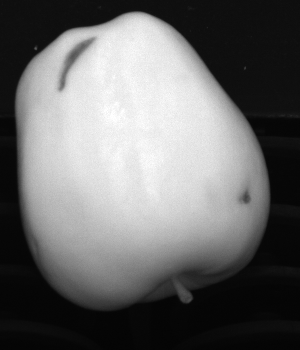 | 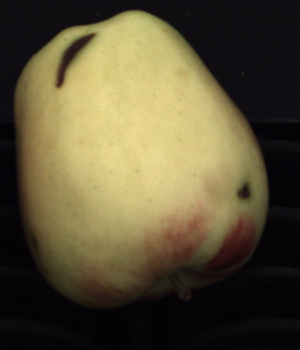 |

In order to localize these defects two steps have to be carried out:
- Each fruit should be outlined by means of a binary mask that separates the foreground (the fruit) from the background. This step is performed through a tresholding technique;
- A search to identify the defects on the fruit must be carried out on the outlined portion of the image.

*Note: given the fact that NIR and color images have little parallax, a mask can be computed on one and applied to the other.*

#### Procedure
Although this is an academic project, the working pipeline has been developed considering an industrial setting where the inspection of the fruits has to be carried out by an *online* system. A set of methods have been tested in terms of quality, speed and robustness.

# 00 Prerequisites
The libraries necessary for the task are imported.

In [1]:
%matplotlib inline

import cv2 as cv
import math
import matplotlib.pyplot as plt
import numpy as np
import sys
from time import time

# Utils libraries
from utils import *

The cell below illustrates the version of `OpenCV` used for the task.

In [2]:
print(f'Using OpenCV version: {cv.__version__}.')

Using OpenCV version: 4.6.0.


The random seed is set for both the `numpy` and `OpenCV` libraries in order to guarantee reproducibility of results.

In [3]:
SEED = 42

cv.setRNGSeed(SEED)
np.random.seed(SEED)

# 01 Image analysis 
The series of images is firstly imported and plotted.

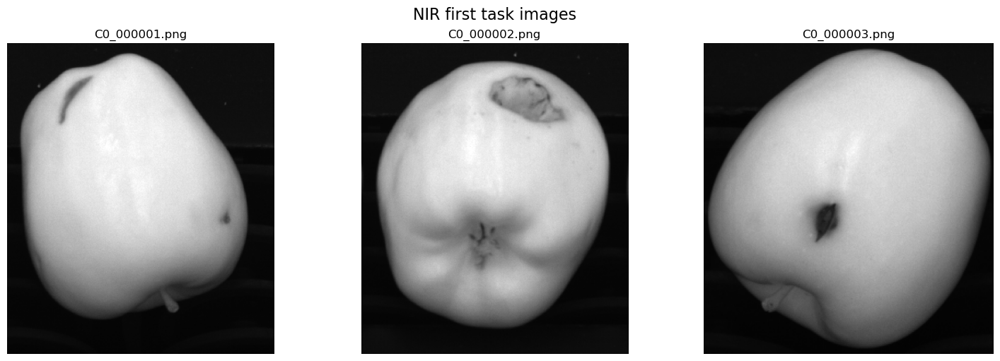

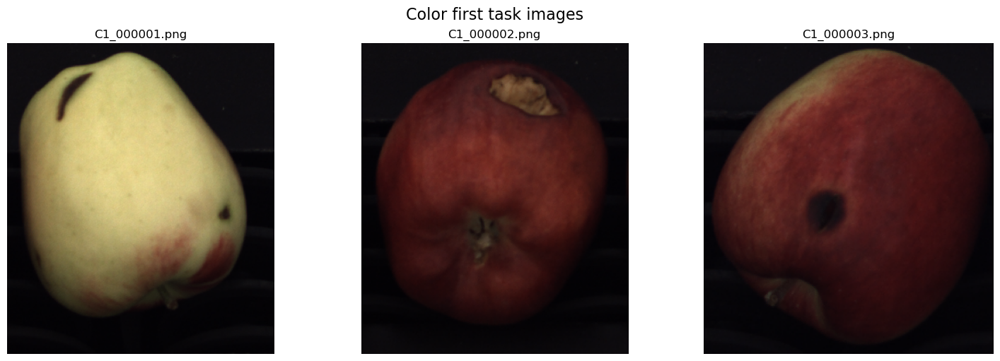

In [4]:
# Create two arrays containing the names of the NIR and color images respectively
nir_names, colour_names = [[f'C{j}_00000{i}.png' for i in range(1,4)] for j in [0,1]]

# Directory where the images are saved
DIR = 'images/first task/'

# Import NIR and color images
nir_imgs = [cv.imread(f'{DIR}{img}', cv.IMREAD_GRAYSCALE) for img in nir_names]
colour_imgs = [cv.imread(f'{DIR}{img}') for img in colour_names]

# Plot the NIR and color images
plot_image_grid(nir_imgs, nir_names, 'NIR first task images')
plot_image_grid(colour_imgs, colour_names, 'Color first task images')

Then, the parallax between images is observed. The NIR and colour images seem to overlap almost perfectly, therefore the NIR version of the images can be used to obtain the binary masks of the fruit which can be applied even on their colour version.

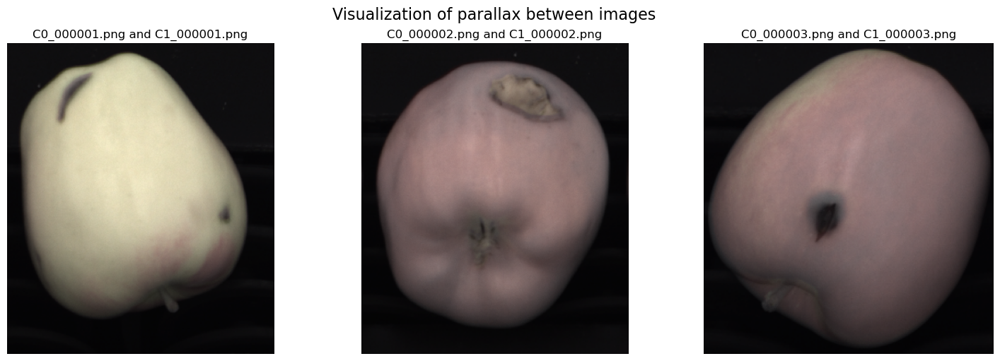

In [5]:
parallaxes = [cv.addWeighted(cv.cvtColor(n, cv.COLOR_GRAY2BGR), 0.5, c, 0.5, 0) 
              for n, c in zip(nir_imgs, colour_imgs)]

plot_image_grid(parallaxes, [f'{n} and {c}' for n, c in zip(nir_names, colour_names)], 
                'Visualization of parallax between images')

Next, the *gray-level histograms* of the three NIR images are computed and shown.

By observing the results we can identify a greater concentration of pixels around the interval $[0, 50]$, which should correspond to background pixels. Moreover, other small peaks are present around higher values for the gray levels, which should represent foreground pixels belonging to the fruit. 

Unfortunately, the distribution of background and foreground pixels is slightly different among the three images. Furthermore the istograms are not clearly *bimodal* and an actual treshold that binarizes the image cannot be trivially identified. It can be observed that image `C0_000003.png` presents an even more confusing separation among background and foreground pixels.

These outcomes should be expected since the NIR images shown above are not *inherently binary*. The shadowy areas due to the lighting variations and the presence of the defects and textures on the fruit are the main reasons of the lack of bimodality in the histogram.

Furthermore, sources of noise may be another impacting factor, in fact, some of the tresholding algorithms presented in the next section consider image preprocessing.

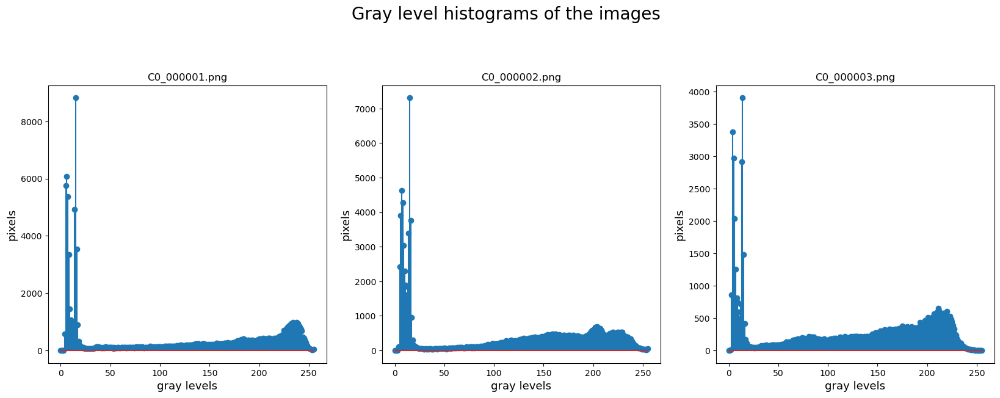

In [6]:
plot_histogram_grid(nir_imgs, nir_names, 'Gray level histograms of the images')

## 02 Preprocessing noise
In order to guarantee better performances during the binarization tasks a pre-processing operation has been applied to the NIR images to remove unwanted noisy signals and smooth them.

More specifically, the following filters have been considered and tested: 
- A *Median blur* non-linear filter using a kernel of dimension $(3 \times 3)$
- A *Bilateral filter* using kernel of dimension $(7 \times 7)$ and spatial standard deviation ($\sigma_s$) and intensity standard deviation ($\sigma_r$) equal to $75$.

The reason behind the choice of these filters is that they are able to preserve the edges of the images during their denoising operations. Edge preservation is important in order to obtain a binary mask that has a good precision in outlining the fruits.

Moreover, median filters are effective in removing impulse noisy signal, which can be observed as small lighter artifacts in the background of the images.

The results are in line with the observation above, as the images are denoised while the edges are preserved and the artifacts on the background are partially removed.

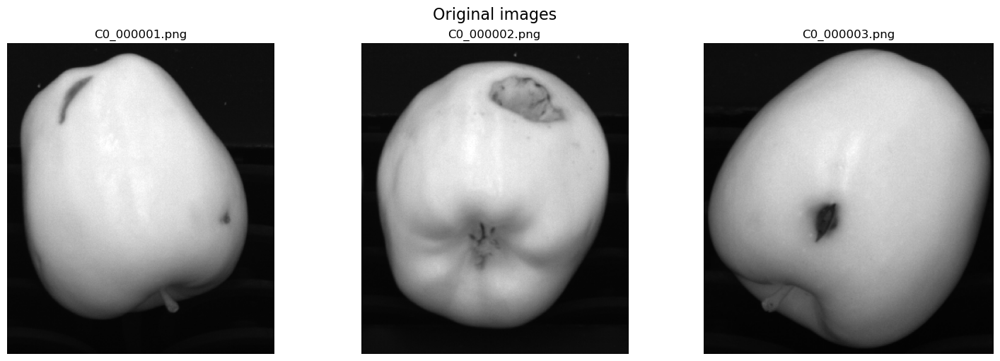

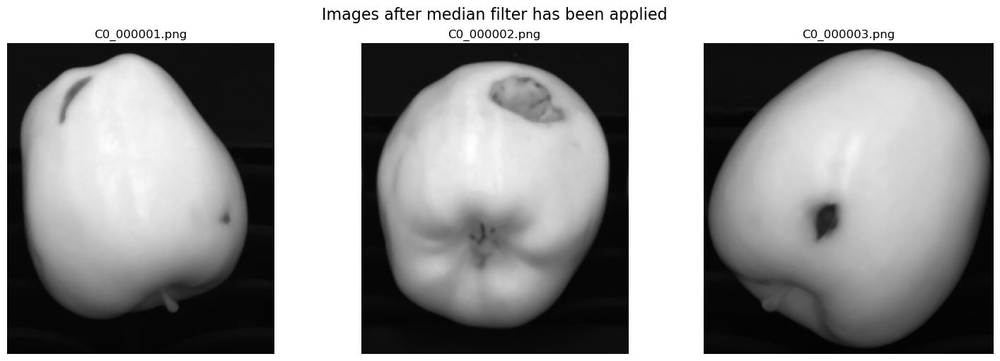

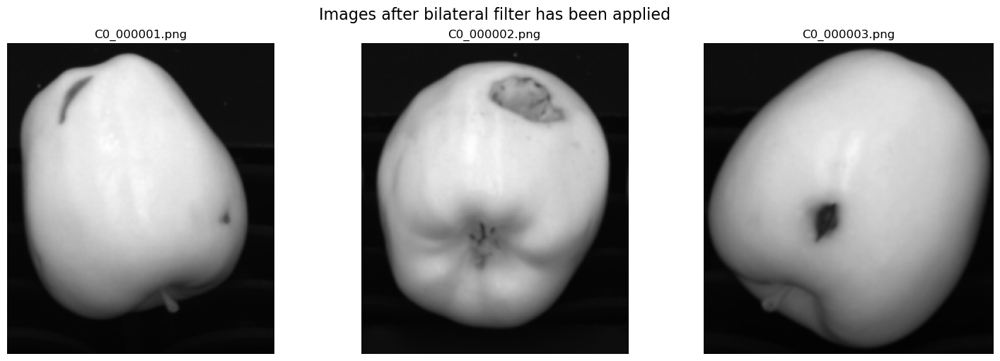

In [7]:
median_images = [cv.medianBlur(img,5) for img in nir_imgs]
bil_images = [cv.bilateralFilter(img, d=5, sigmaColor=75, sigmaSpace=75) for img in nir_imgs]

plot_image_grid(nir_imgs, nir_names, 'Original images')
plot_image_grid(median_images, nir_names, 'Images after median filter has been applied')
plot_image_grid(bil_images, nir_names, 'Images after bilateral filter has been applied')

In [8]:
s = time()
for img in nir_imgs * 1_000:
    cv.medianBlur(img,5)
median_time = time() - s

s = time()
for img in nir_imgs * 1_000:
    cv.bilateralFilter(img, d=7, sigmaColor=75, sigmaSpace=75)
bilateral_time = time() - s

The two filters have been tested on the set of images for a total of $3,000$ times. 
It is evident how the median filter is faster, hence preferred to the bilateral filter.

In [9]:
print(f'Time for preprocessing {1_000 * len(colour_imgs)} images with a median filter: {median_time:.6f}')
print(f'Mean time for preprocessing an image with a median filter: {(median_time / (1_000 * len(colour_imgs))):.6f}')
print()

print(f'Time for preprocessing {1_000 * len(colour_imgs)} images with a bilateral filter: {bilateral_time:.6f}')
print(f'Mean time for preprocessing an image with a bilateral filter: {(bilateral_time / (1_000 * len(colour_imgs))):.6f}')

Time for preprocessing 3000 images with a median filter: 2.382003
Mean time for preprocessing an image with a median filter: 0.000794

Time for preprocessing 3000 images with a bilateral filter: 3.837885
Mean time for preprocessing an image with a bilateral filter: 0.001279


In [10]:
filtered_images = median_images

The *gray-scale* histograms of the original NIR images and of the images pre-processed by the median filter are shown below. No significant differences can be observed.

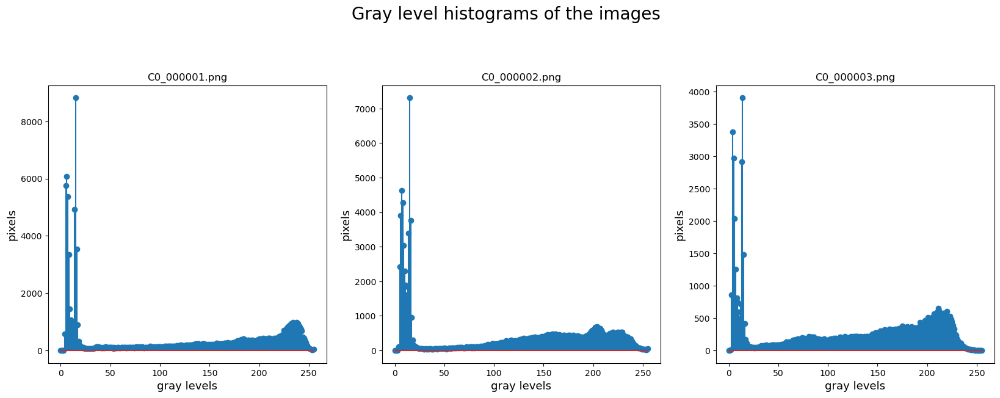

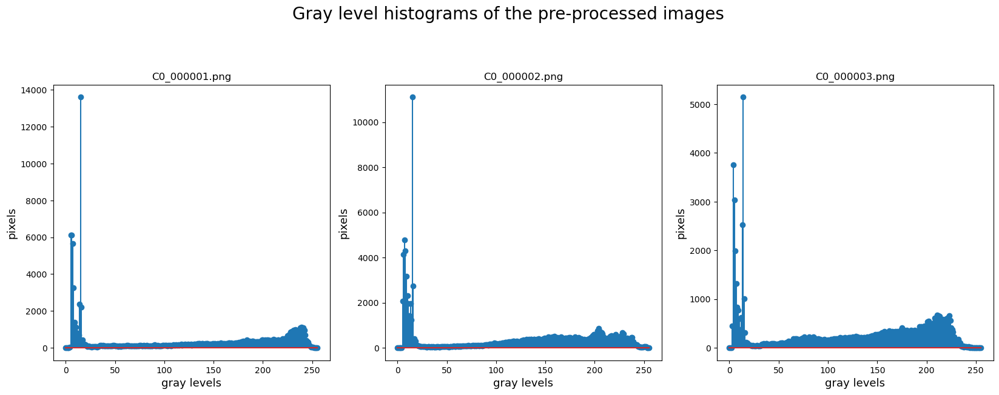

In [11]:
plot_histogram_grid(nir_imgs, nir_names, 'Gray level histograms of the images')
plot_histogram_grid(filtered_images, nir_names, 'Gray level histograms of the pre-processed images')

# 03 Outline the fruit by generating a binary mask
In order to compute the binary mask that outlines the fruit image segmentation through binary tresholding is applied.

In particular, four different methods are taken into consideration and compared in terms of time performances, robustness and quality of the output.

The considered methods are:
- *Manual Binarization by Intensity Thresholding*;
- *Otsu's Algorithm*;
- *A tweaked version of Otsu's Algorithm*;
- *Adaptive Thresholding*.

For each technique (Except *Adaptive Thresholding*, which uses a slightly different approach) the pipline to obtain the mask of a fruit is the following:
1. An initial mask of the fruit is obtained by thresholding the NIR image through a specific method in order to remove the background;
2. The possible holes present inside the mask of the fruit are removed through a flood-fill approach:
    - The mask is padded by one-pixel-unit on each dimension with pixels of intensity equal to the background ($0$). This procedure guarantees that if a fruit overflows the image the flood-filling operation will still be applied on the whole background;
    - The mask is flood-filled with color equal to the fruit region ($255$), this way solely the holes will be visible with intensity $0$.;
    - The padding is removed and the colours of the mask inverted, so the holes will have intensity $255$, which is the same colour as the one of the fruit region in the mask computed at point 1;
    - A bitwise addition between the mask computed at the previous point and the one obtained at point 1 is performed, thus obtaining a mask where the region of the fruit will have intensity $255$ and no holes.

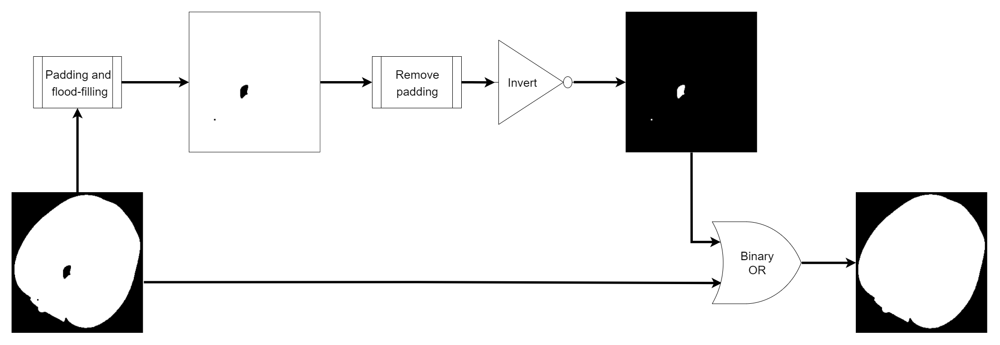

The algorithms robustness to small light changes is tested by observing their results on a slightly darker and lighter version of the provided NIR images (already pre-processed by a median blur).

These images are obtained by applying a change of contrast to the original ones.

In [12]:
'''filtered_darker_images = [change_contrast_grayscale(img, .5) for img in filtered_images]
filtered_lighter_images = [change_contrast_grayscale(img) for img in filtered_images]

plot_image_grid(filtered_images, colour_names, 'Original images')
plot_image_grid(filtered_darker_images, colour_names, 'Darker images')
plot_image_grid(filtered_lighter_images, colour_names, 'Lighter images')''';

## 03.1 Binarization by Intensity Tresholding
This first approach is the simplest and faster. A global treshold $t$ is manually provided in order to binarize the image $I$ by transforming each of its pixels $(i,j)$, such that:

$$\forall i,j, \ I(i,j) = 
\begin{cases} 
    0, & \text{if} \ I(i,j) \leq t \\
    255, & \text{otherwise}
\end{cases}$$

Where $0$ corresponds to background pixels and $255$ to foreground pixels.

As previously explained, finding such treshold is not trivial given that the gray-level histogram is not bimodal.
Various experiments have shown that a good value of this treshold that guarantees a good binarization is found in the range $[20-30]$ after a *Gaussian smoothing* filter has been applied to remove noisy signals.

The gaussian filter has

The used filter 

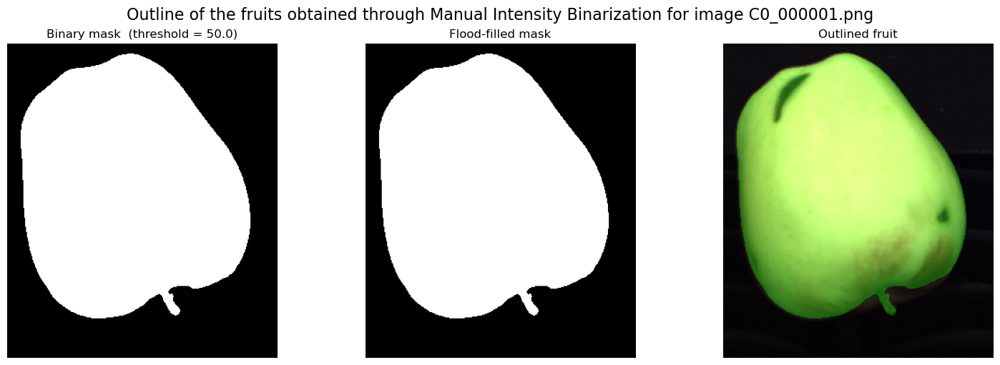

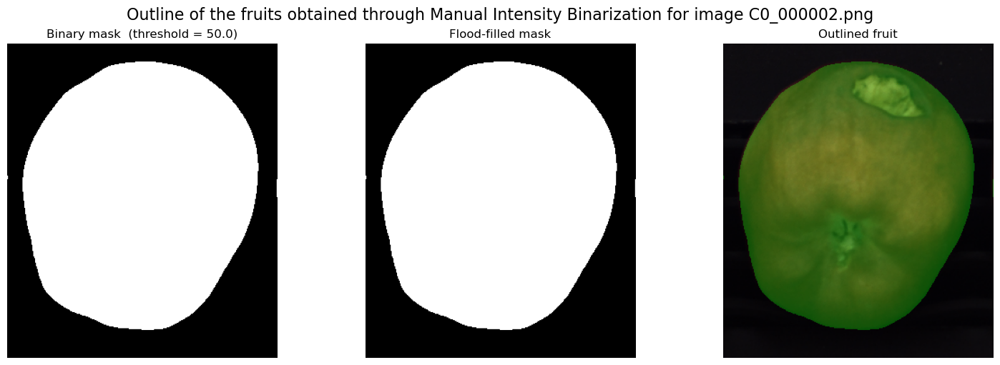

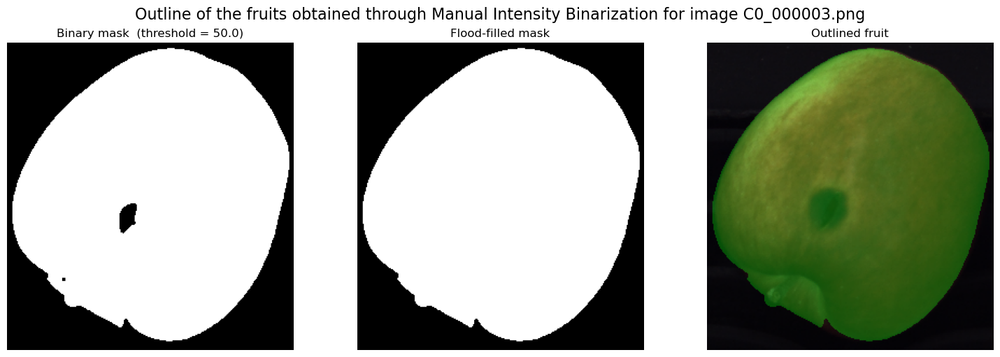

In [13]:
MANUAL_THRESHOLD = 50
plot_masking_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.MANUAL, threshold=MANUAL_THRESHOLD)

In [14]:
REPEATS = 1_000

In [15]:
total_manual_time, mean_manual_time = get_thresholding_time(
    filtered_images, ThresholdingMethod.MANUAL, threshold=MANUAL_THRESHOLD, repeats=REPEATS)

Total time to perform Manual Intensity Binarization on 3000  images = 0.907429
Mean time per instance to perform Manual Intensity Binarization = 0.000302


## 03.2 Binarization by Otsu's Algorithm

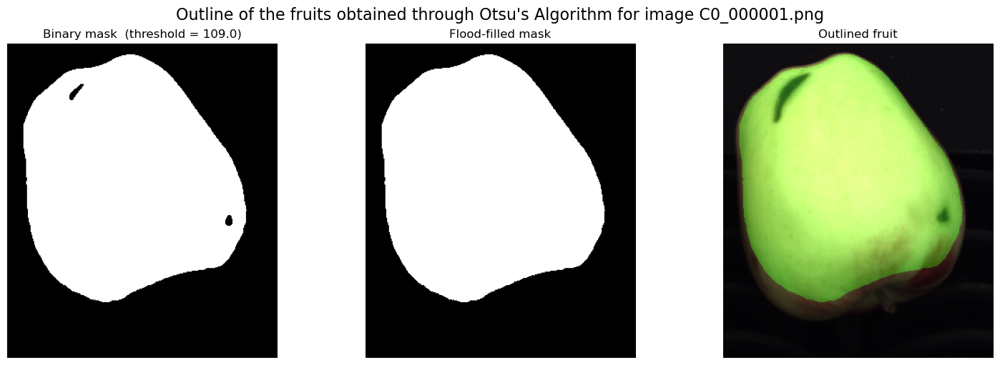

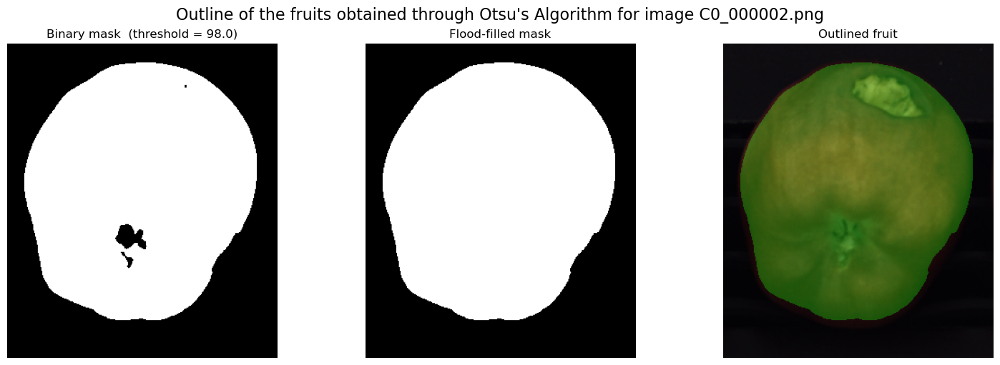

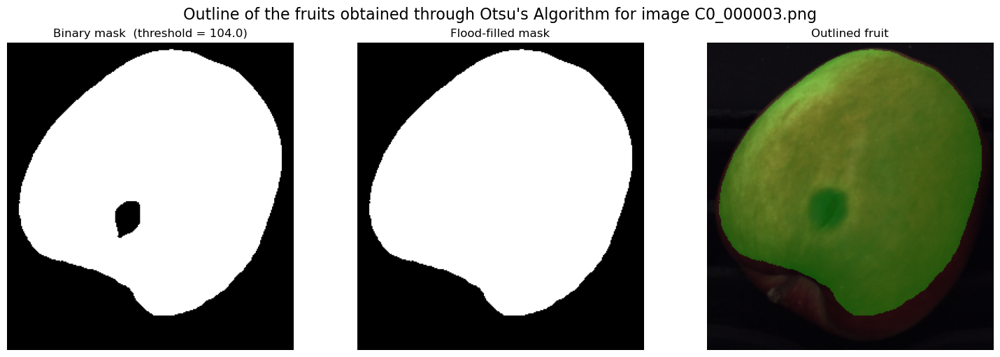

In [16]:
plot_masking_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.OTSU)

In [17]:
total_otsu_time, mean_otsu_time = get_thresholding_time(
    filtered_images, ThresholdingMethod.OTSU, repeats=REPEATS)

Total time to perform Otsu's Algorithm on 3000  images = 1.145593
Mean time per instance to perform Otsu's Algorithm = 0.000382


## 03.3 Binarization by a tweaked version of Otsu's Algorithm

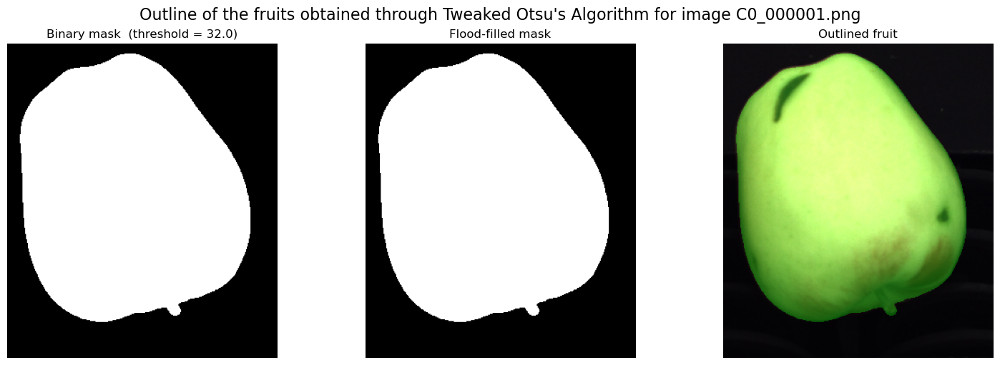

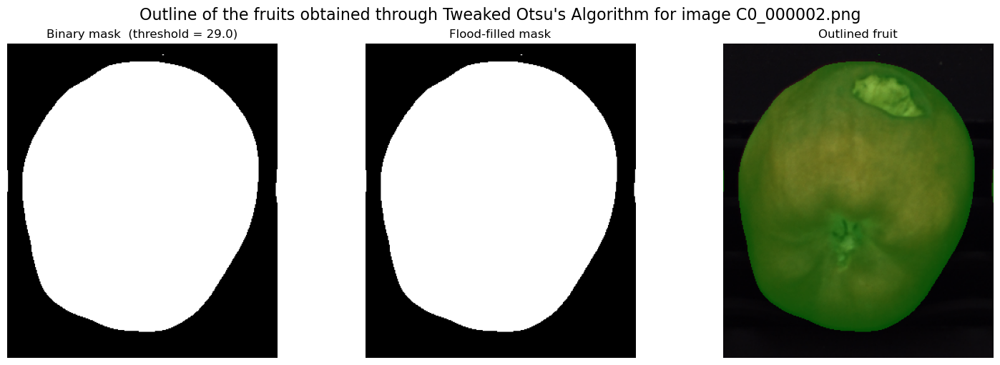

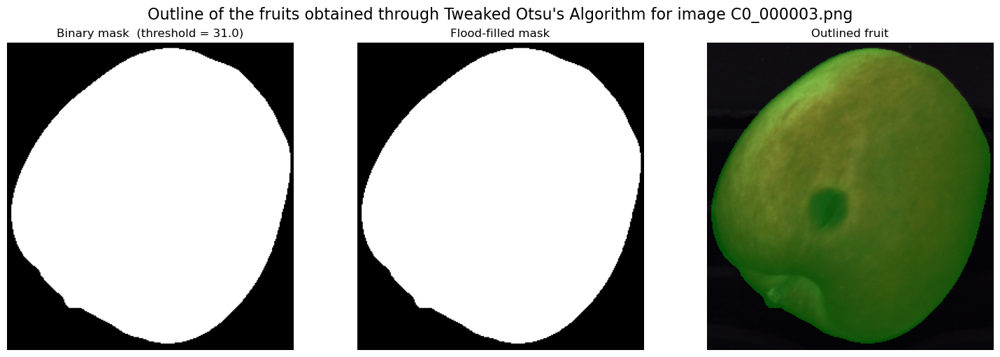

In [18]:
TWEAK_FACTOR = .3
plot_masking_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR)

In [19]:
total_tweaked_otsu_time, mean_tweaked_otsu_time = get_thresholding_time(
    filtered_images, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR, repeats=REPEATS)

Total time to perform Tweaked Otsu's Algorithm on 3000  images = 1.291478
Mean time per instance to perform Tweaked Otsu's Algorithm = 0.000430


## 03.4 Binarization by Adaptive thresholding

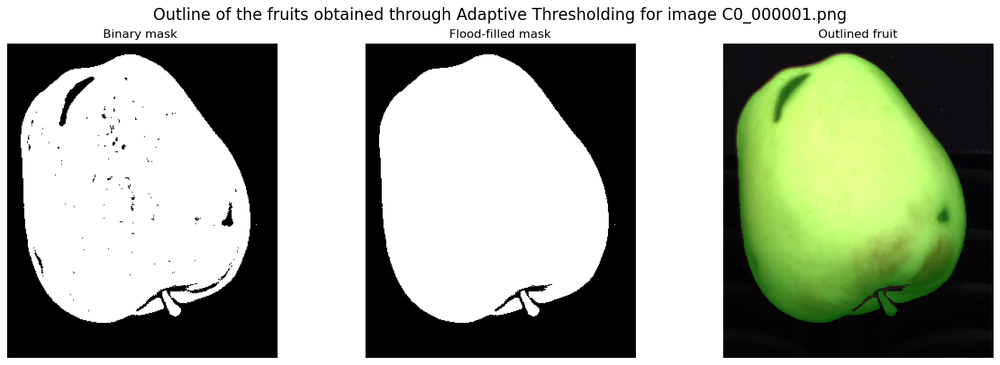

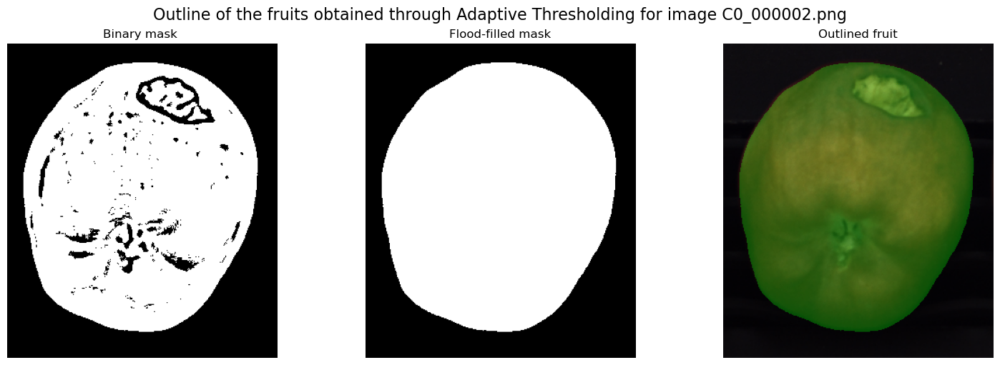

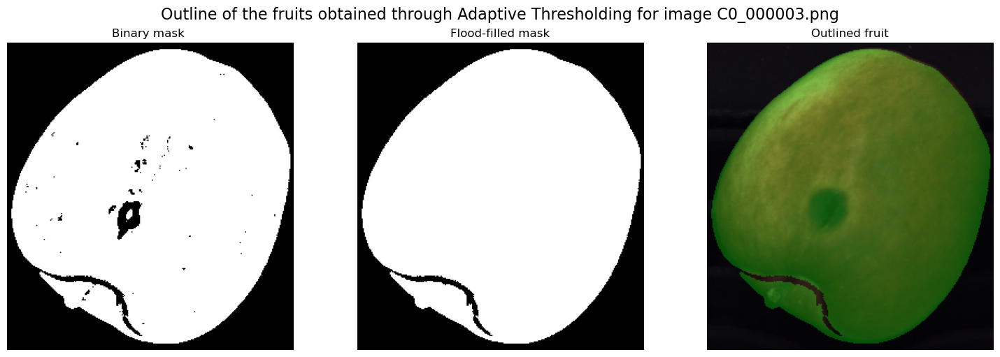

In [20]:
BLOCK_SIZE = 11
C = 3

plot_masking_process(filtered_images, colour_imgs, nir_names, ThresholdingMethod.ADAPTIVE, 
                     block_size=BLOCK_SIZE, c=C)

In [21]:
'''plot_thresholding_on_light_and_dark_images(filtered_darker_images, filtered_lighter_images, nir_names, 
                                           ThresholdingMethod.ADAPTIVE, block_size=BLOCK_SIZE, c=C)''';

In [22]:
total_adaptive_time, mean_adaptive_time = get_thresholding_time(
    filtered_images, ThresholdingMethod.ADAPTIVE, block_size=BLOCK_SIZE, c=C, repeats=REPEATS)

Total time to perform Adaptive Thresholding on 3000  images = 1.826977
Mean time per instance to perform Adaptive Thresholding = 0.000609


## 03.5 Comparisons of the thresholding algorithms

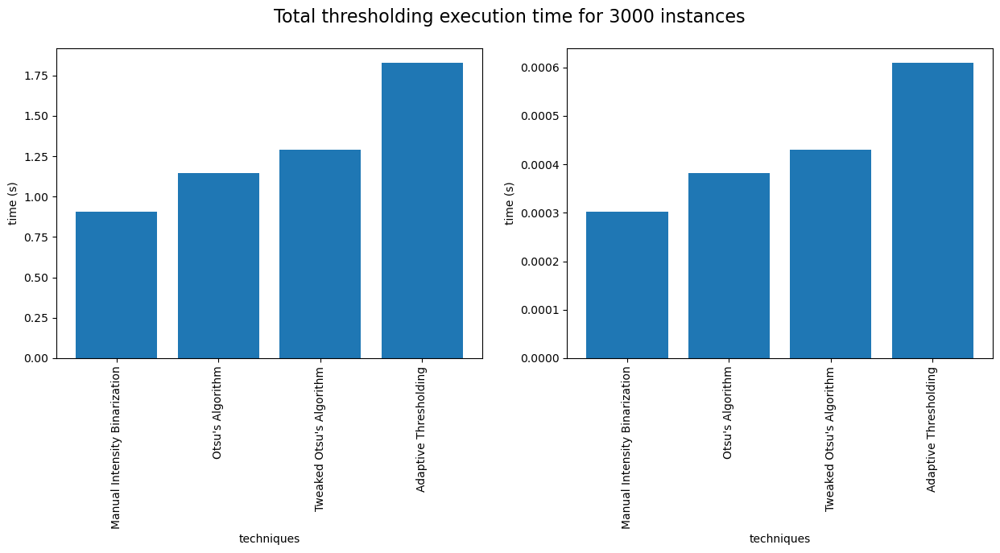

In [23]:
labels = ['Manual Intensity Binarization', "Otsu's Algorithm", "Tweaked Otsu's Algorithm", 'Adaptive Thresholding']

ys_tot = [total_manual_time, total_otsu_time, total_tweaked_otsu_time, total_adaptive_time]
ys_mean = [mean_manual_time, mean_otsu_time, mean_tweaked_otsu_time, mean_adaptive_time]
xs = np.arange(len(labels))

fig, axes = plt.subplots(1, 2, figsize=(15,5))

axes[0].bar(xs, ys_tot, align='center')
axes[1].bar(xs, ys_mean, align='center')

for ax in axes:
    ax.set_xticks(xs, labels, rotation=90)
    ax.set_xlabel('techniques')
    ax.set_ylabel('time (s)')

fig.suptitle('Total thresholding execution time for 3000 instances', fontsize=16)

plt.show()

## 03.6 Results

In [24]:
masks = [get_fruit_mask(img, ThresholdingMethod.TWEAKED_OTSU, tweak_factor=TWEAK_FACTOR) for img in filtered_images]

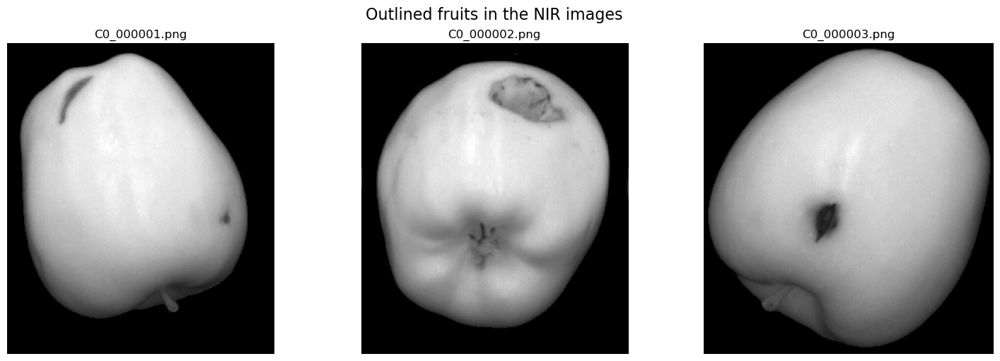

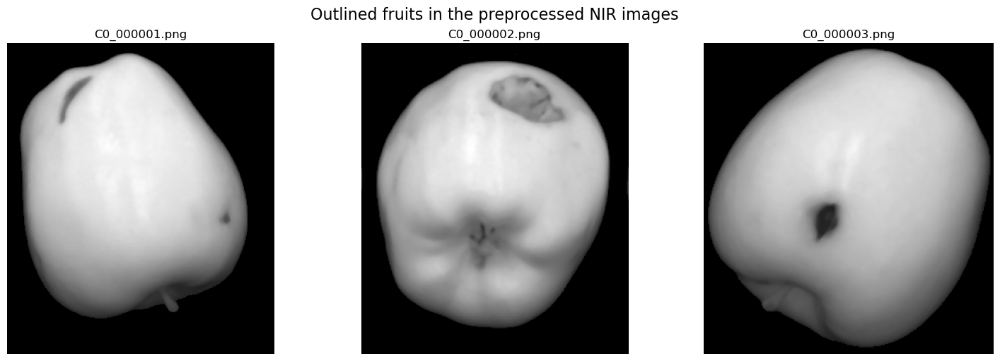

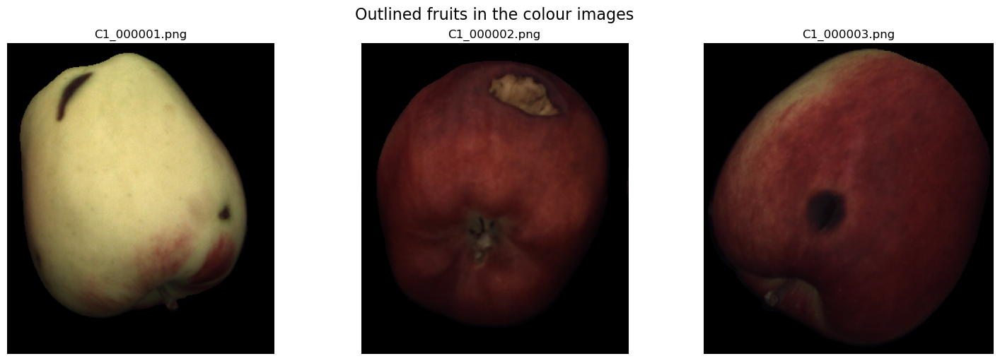

In [25]:
masked_nir_imgs = [nir_imgs[i] & masks[i] for i in range(len(masks))]
masked_filtered_imgs = [filtered_images[i] & masks[i] for i in range(len(masks))]
masked_colour_imgs = [colour_imgs[i] &  cv.cvtColor(masks[i], cv.COLOR_GRAY2BGR) for i in range(len(masks))]

plot_image_grid(masked_nir_imgs, nir_names, 'Outlined fruits in the NIR images')
plot_image_grid(masked_filtered_imgs, nir_names, 'Outlined fruits in the preprocessed NIR images')
plot_image_grid(masked_colour_imgs, colour_names, 'Outlined fruits in the colour images')

# 04 Defects identification

## 04.01 Edge detection

HINT: the defects have strong edges, so edge extraction algorithm should help. Also, they usually exhibit a far
darker color with respect to the neighboring areas of the fruit


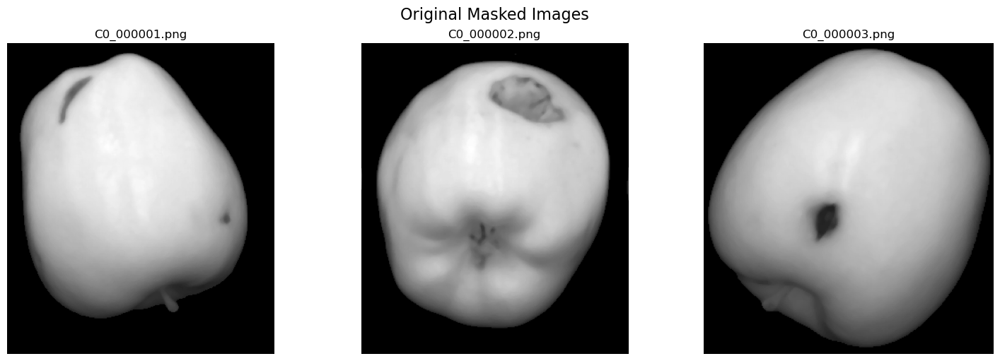

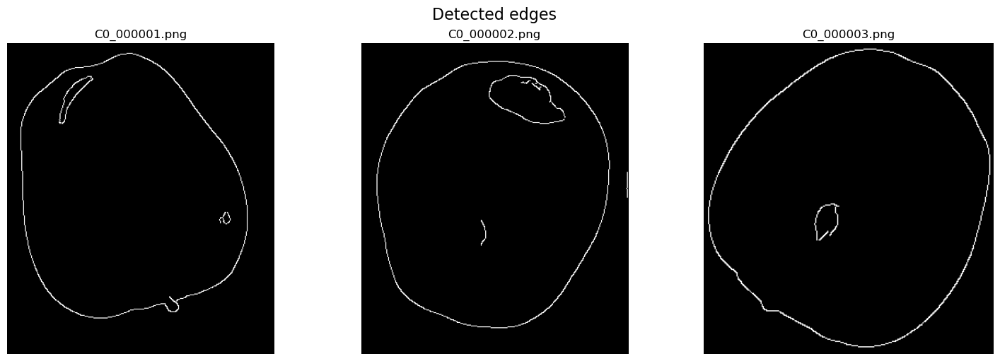

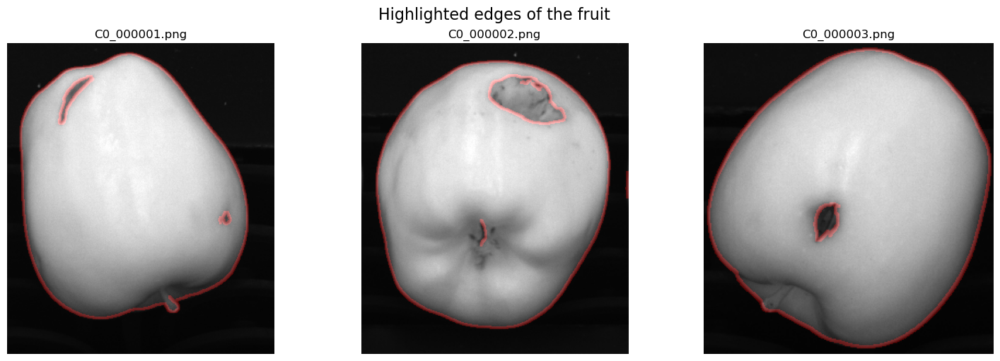

In [26]:
SIGMA = 1
THRESHOLD_1 = 60
THRESHOLD_2 = 130

edge_masks = [apply_gaussian_blur_and_canny(img, SIGMA, THRESHOLD_1, THRESHOLD_2) for img in masked_filtered_imgs]

highlighted_edges_images = [get_highlighted_edges_on_image(img, e) for img, e in zip(nir_imgs, edge_masks)]

plot_image_grid(masked_filtered_imgs, nir_names, 'Original Masked Images')
plot_image_grid(edge_masks, nir_names, 'Detected edges')
plot_image_grid(highlighted_edges_images, nir_names, 'Highlighted edges of the fruit')

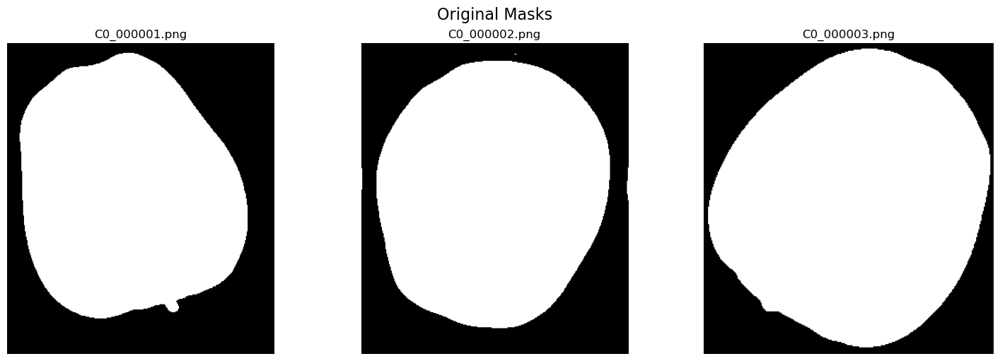

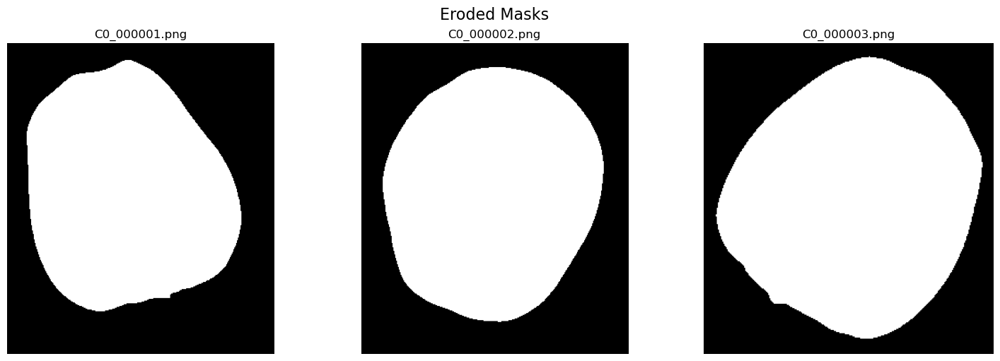

In [27]:
element = cv.getStructuringElement(cv.MORPH_RECT, (15, 15))
eroded_masks = [cv.erode(img, element) for img in masks]

plot_image_grid(masks, nir_names, 'Original Masks')
plot_image_grid(eroded_masks, nir_names, 'Eroded Masks')

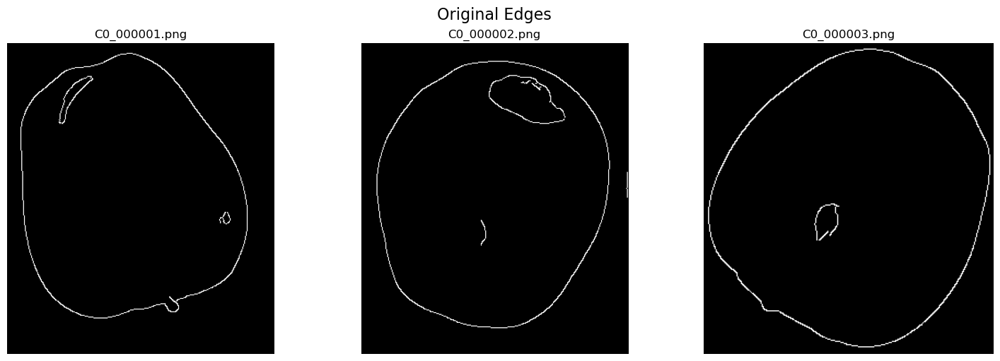

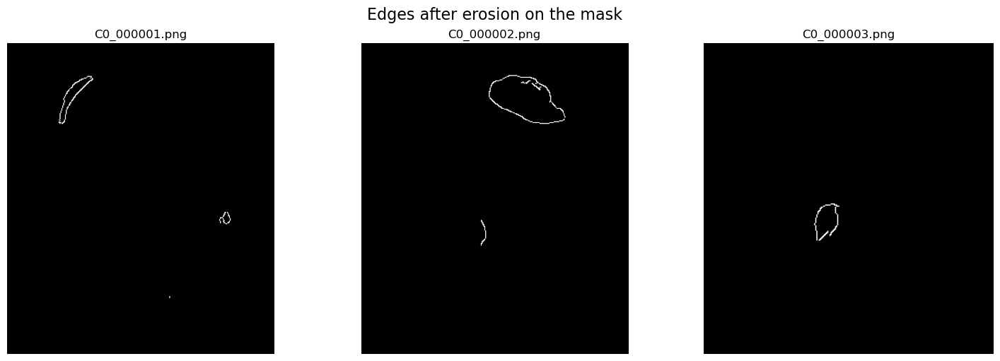

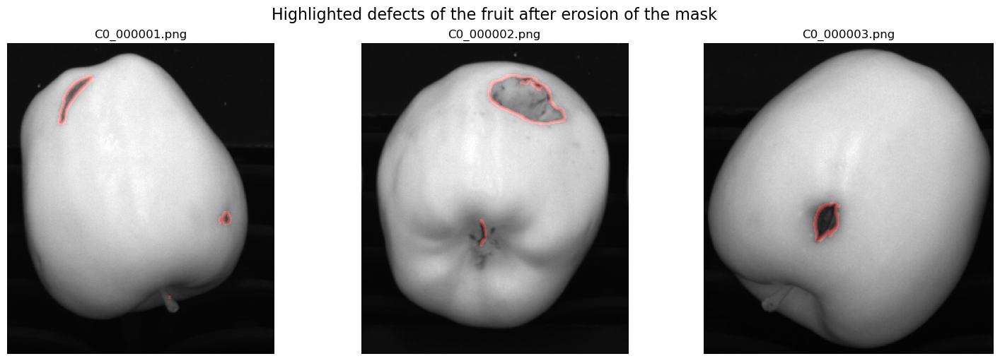

In [28]:
eroded_edge_masks = [edge_masks[i] &  eroded_masks[i] for i in range(len(masks))]
highlighted_edges_images = [get_highlighted_edges_on_image(img, e) for img, e in zip(nir_imgs, eroded_edge_masks)]

plot_image_grid(edge_masks, nir_names, 'Original Edges')
plot_image_grid(eroded_edge_masks, nir_names, 'Edges after erosion on the mask')
plot_image_grid(highlighted_edges_images, nir_names, 'Highlighted defects of the fruit after erosion of the mask')

## 04.02 Defect blobs filling

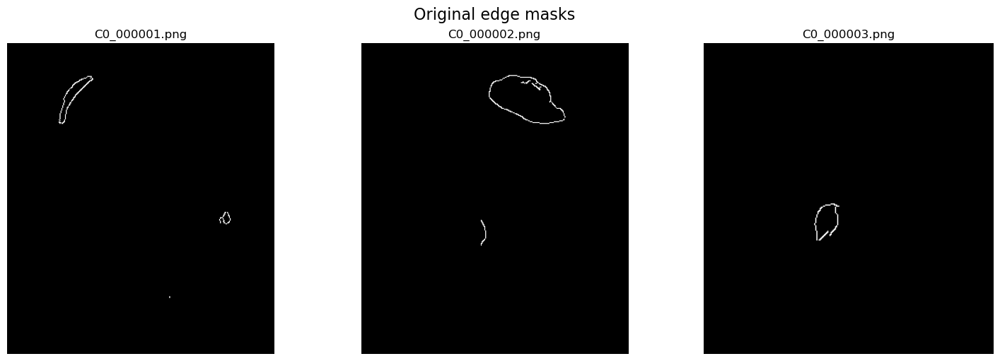

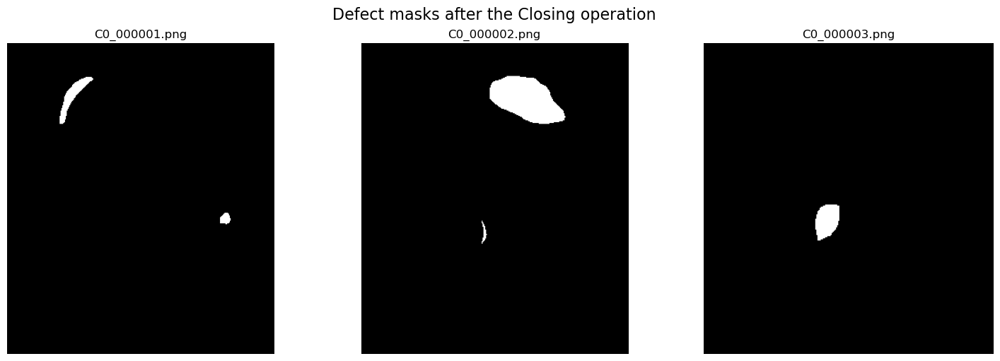

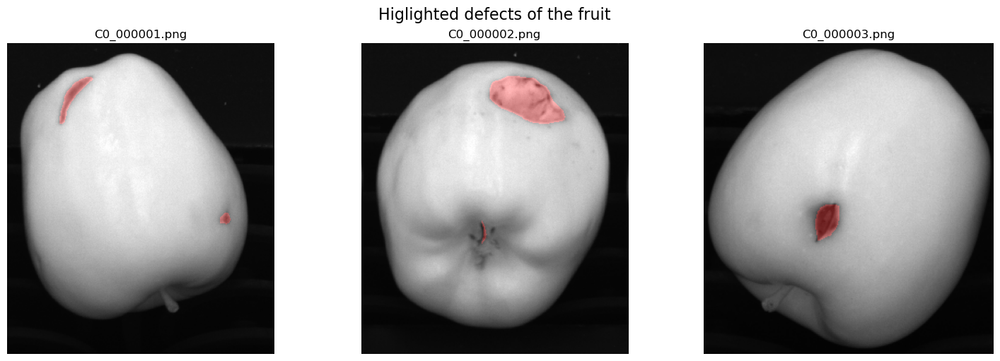

In [29]:
element = cv.getStructuringElement(cv.MORPH_ELLIPSE, (50, 50))
defect_masks = [cv.morphologyEx(img, cv.MORPH_CLOSE, element) for img in eroded_edge_masks]
highlighted_defects = [get_highlighted_roi_by_mask(img, e, 'red') for img, e in zip(nir_imgs, defect_masks)]

plot_image_grid(eroded_edge_masks, nir_names, 'Original edge masks')
plot_image_grid(defect_masks, nir_names, 'Defect masks after the Closing operation')
plot_image_grid(highlighted_defects, nir_names, 'Higlighted defects of the fruit')

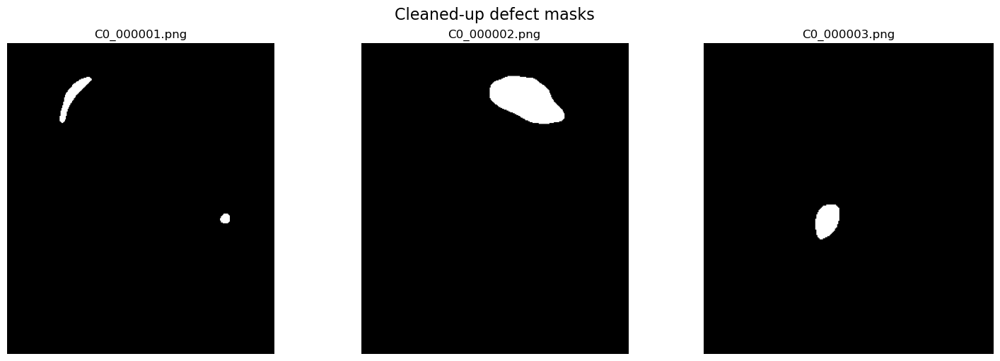

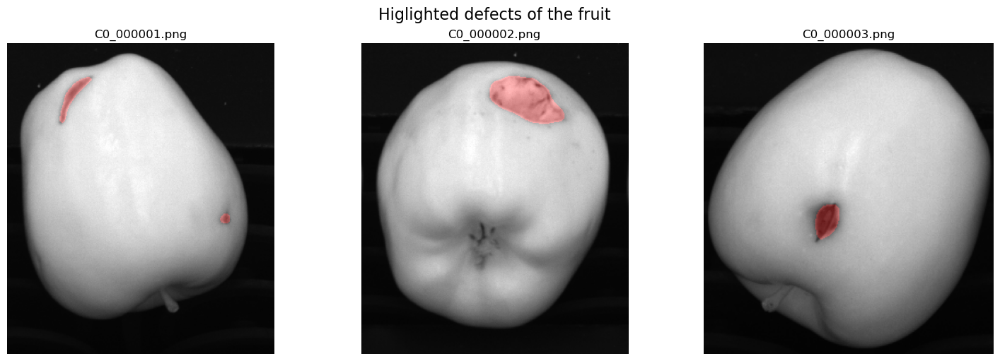

In [30]:
defect_masks = [cv.medianBlur(m, 7) for m in defect_masks]
highlighted_defects = [get_highlighted_roi_by_mask(img, e, 'red') for img, e in zip(nir_imgs, defect_masks)]

plot_image_grid(defect_masks, nir_names, 'Cleaned-up defect masks')
plot_image_grid(highlighted_defects, nir_names, 'Higlighted defects of the fruit')

## 05 Results

In [31]:
from execute_first_task import detect_defects

Detected 2 defects for image C1_000001.png.


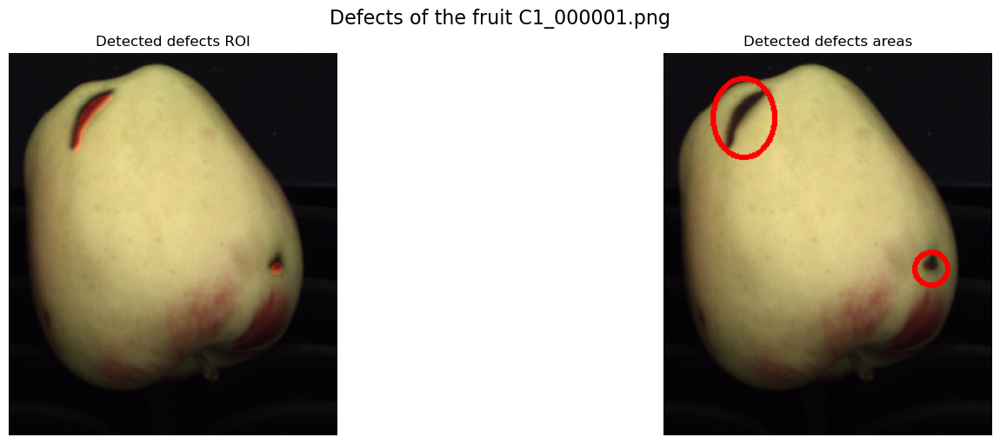

Detected 1 defect for image C1_000002.png.


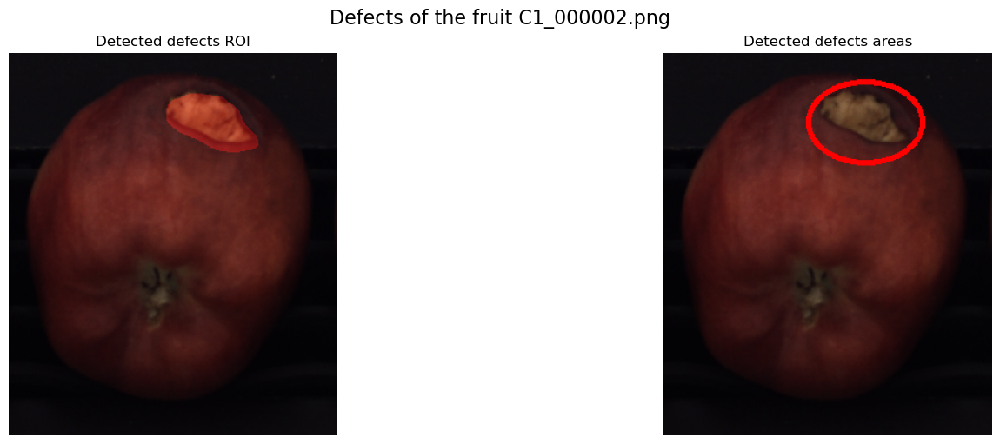

Detected 1 defect for image C1_000003.png.


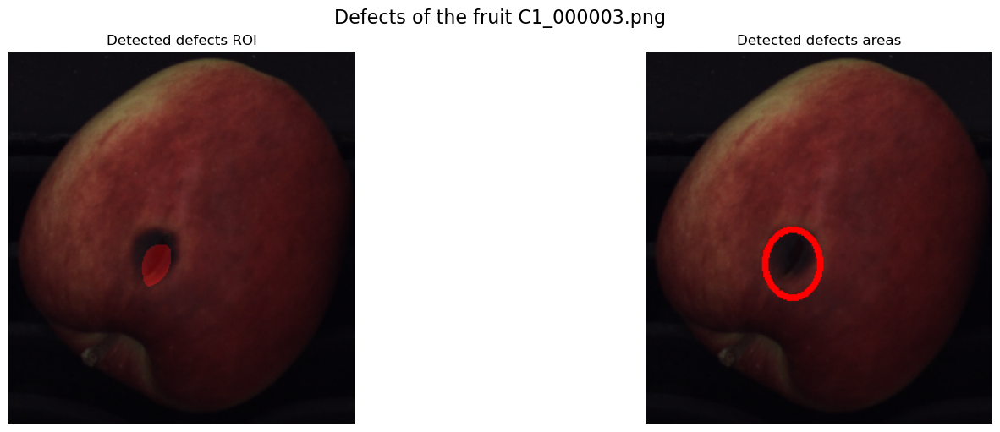

In [32]:
_ = detect_defects(colour_imgs[0], nir_imgs[0], colour_names[0], tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2)
_ = detect_defects(colour_imgs[1], nir_imgs[1], colour_names[1], tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2)
_ = detect_defects(colour_imgs[2], nir_imgs[2], colour_names[2], tweak_factor=TWEAK_FACTOR, sigma=SIGMA,
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2)

In [33]:
s = time()

for col, nir, name in list(zip(colour_imgs, nir_imgs, colour_names)) * 1_000:
    detect_defects(col, nir, name,  tweak_factor=TWEAK_FACTOR, sigma=SIGMA, 
                   threshold_1=THRESHOLD_1, threshold_2=THRESHOLD_2, verbose=False)

total_time = time() - s

In [34]:
print(f'Time for detecting the defects of {1_000 * len(colour_imgs)} images of fruits: {total_time:.6f}')
print(f'Mean time for detecting the defects of an image of a fruit: {(total_time / (1_000 * len(colour_imgs))):.6f}')

Time for detecting the defects of 3000 images of fruits: 68.263426
Mean time for detecting the defects of an image of a fruit: 0.022754
